### 0. Imports

In [1]:
%load_ext autoreload
%autoreload 2

# Data transformation
# ------------------------------------------------------
import pandas as pd
import numpy as np
import math

# Visualizations
# -----------------------------------------------------------------------
import seaborn as sns
import matplotlib.pyplot as plt
import plotly_express as px

# Preprocessing and clustering
# ------------------------------------------------------
from sklearn.preprocessing import OrdinalEncoder, RobustScaler, MinMaxScaler, StandardScaler
from sklearn.cluster import DBSCAN, KMeans
from sklearn.cluster import SpectralClustering
from sklearn.metrics import silhouette_score, pairwise_distances,  davies_bouldin_score, calinski_harabasz_score
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE


# Handle warnings
# -----------------------------------------------------------------------
import warnings
warnings.filterwarnings("once")
warnings.filterwarnings("ignore", category=DeprecationWarning)

# modify system variables
# -----------------------------------------------------------------------
import sys
sys.path.append("..") # append parent folder to path

# modify operating system structures
# -----------------------------------------------------------------------
import os

# import support functions
# -----------------------------------------------------------------------
import src.soporte_eda as se
import src.soporte_preprocesamiento as sp
import src.soporte_clustering as sc
import src.data_visualization_support as dvs
import src.soporte_outliers as so

In [2]:
def plot_3D_clusters(dataframe):
    fig = plt.figure(figsize=(10, 7))
    ax = fig.add_subplot(111, projection='3d')

    # Scatter plot of the PCA-transformed data
    ax.scatter(dataframe.iloc[:, 0], dataframe.iloc[:, 1], dataframe.iloc[:, 2], c='b', s=50, alpha=0.6, edgecolor='k')
    
    # Labels and title
    ax.set_title('3D PCA Clusters')
    ax.set_xlabel(f"{dataframe.columns[0]}")
    ax.set_ylabel(f"{dataframe.columns[1]}")
    ax.set_zlabel(f"{dataframe.columns[2]}")

    plt.show()


# function to calculate corr per client
def calculate_discount_expense_correlation(grupo):
    if len(grupo['discount'].unique()) > 1: # if there's variation in discounts
        return grupo['discounted_price'].corr(grupo['sales'], method="spearman")  # return pearson corr
    return 0  # else 0


def choose_kmeans_k(dataframe):
    # Define range of clusters
    k_range = range(2, 16)
    inertia = []
    silhouette = []
    calinski_harabasz = []
    davies_bouldin = []

    X = dataframe

    # Fit KMeans for each k and calculate metrics
    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=42)
        kmeans.fit(X)
        inertia.append(kmeans.inertia_)
        silhouette.append(silhouette_score(X, kmeans.labels_))
        calinski_harabasz.append(calinski_harabasz_score(X, kmeans.labels_))
        davies_bouldin.append(davies_bouldin_score(X, kmeans.labels_))


    # Plot metrics
    plt.figure(figsize=(15, 10))

    # Inertia Plot
    plt.subplot(2, 2, 1)
    plt.plot(k_range, inertia, marker='o')
    plt.title('Inertia')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Inertia')

    # Silhouette Score
    plt.subplot(2, 2, 2)
    plt.plot(k_range[1:], silhouette[1:], marker='o')  # Skip k=1
    plt.title('Silhouette Score')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Silhouette Score')

    # Calinski-Harabasz Index
    plt.subplot(2, 2, 3)
    plt.plot(k_range[1:], calinski_harabasz[1:], marker='o')  # Skip k=1
    plt.title('Calinski-Harabasz Index')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Score')

    # Davies-Bouldin Index
    plt.subplot(2, 2, 4)
    plt.plot(k_range[1:], davies_bouldin[1:], marker='o')  # Skip k=1
    plt.title('Davies-Bouldin Index')
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Score')

    plt.tight_layout()
    plt.show()


def perform_PCA(dataframe):
    pca = PCA()
    X_pca = pd.DataFrame(pca.fit_transform(dataframe))

    # Calculate explained variance ratio
    explained_variance_ratio = pca.explained_variance_ratio_
    cumulative_variance = np.cumsum(explained_variance_ratio)

    # Plot explained variance
    plt.figure(figsize=(8, 5))
    plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, alpha=0.7, label='Individual Variance')
    plt.step(range(1, len(cumulative_variance) + 1), cumulative_variance, where='mid', label='Cumulative Variance', color='orange')

    # Add titles and labels
    plt.title('Explained Variance by Principal Components')
    plt.xlabel('Principal Component')
    plt.ylabel('Explained Variance Ratio')
    plt.xticks(range(1, len(explained_variance_ratio) + 1))
    plt.legend(loc='best')
    plt.grid()
    plt.show()

    return X_pca


def t_sne(dataframe, dim=2, perplexity=5):
    # Perform t-SNE
    tsne = TSNE(n_components=3, random_state=42, perplexity=perplexity, max_iter=1000)
    X_tsne = tsne.fit_transform(dataframe)

    if dim == 2:
        # Plot the t-SNE results in 2D
        plt.figure(figsize=(8, 6))
        plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c='b', alpha=0.6, edgecolor='k', s=50)
        plt.title(f't-SNE Visualization, perplexity {perplexity}')
        plt.xlabel('t-SNE Dimension 1')
        plt.ylabel('t-SNE Dimension 2')
        plt.grid()
        plt.show()

    else:
        # Plot the t-SNE results in 3D
        fig = plt.figure(figsize=(10, 7))
        ax = fig.add_subplot(111, projection='3d')

        # Scatter plot of t-SNE results
        ax.scatter(X_tsne[:, 0], X_tsne[:, 1], X_tsne[:, 2], c='b', alpha=0.6, edgecolor='k', s=50)

        # Add labels and title
        ax.set_title(f't-SNE Visualization in 3D, perplexity {perplexity}')
        ax.set_xlabel('t-SNE Dimension 1')
        ax.set_ylabel('t-SNE Dimension 2')
        ax.set_zlabel('t-SNE Dimension 3')

        plt.show()



# 1. Intro to clustering notebook and data import

## 1.1 Introduction

The purporse of this clustering notebook is to perform the necessary preprocessing, configuration, tuning and evaluation of different clustering methods to identify different groups of customers and/or products.

## 1.2 Data import

In [3]:
global_superstore = pd.read_pickle("../data/cleaned/global_superstore.pkl")

# 2. Clustering - customers

## 2.1 Features to introduce

Given that we want to identify groups of clusters in a way that provides information about their behaviour, the columns selected must be related to the choices they make.

Features to introduce are an engineering product of some already present features about how customers order goods:
- Order frequency
- Mean/median ticket
- Shipping costs they choose (completely correlated to shipping mode), either due to country or ship_mode
- Their spending correlation with discounts

Profits are related to the discounts applied and customers know nothing about this, so we should not categorise them based on it.

Another variation for this would be:
- Order frequency
- Mean/median price per unit in each order
- Quantities of products
- Shipping costs they choose (completely correlated to shipping mode), either due to country or ship_mode
- Their spending correlation with discounts

Tuning

Dimensionality Reduction

Variations:
- Include categorical features
- Mean/median: introduce one, the other, both.


#### Categorical

Another variation to inclu


## 2.2 Aggregation

To cluster by customer, it is necessary for the data to have each row to represent each customer.

##### Calculate avg orders month

In [4]:
global_superstore["year_month"] = global_superstore["order_date"].dt.to_period('M')
global_superstore["year_month"]

0        2012-07
1        2013-02
2        2013-10
3        2013-01
4        2013-11
          ...   
51285    2014-06
51286    2014-06
51287    2013-12
51288    2012-02
51289    2012-05
Name: year_month, Length: 51290, dtype: period[M]

In [5]:
avg_purchase_freq = global_superstore.groupby(
    ["customer_id", "year_month"]
).agg(
    orders_month=("order_id", "nunique")
).groupby("customer_id").agg(avg_orders_month=("orders_month","mean"))

avg_purchase_freq.head()

,avg_orders_month
customer_id,
AA-10315,1.444444
AA-10375,1.192308
AA-10480,1.315789
AA-10645,1.678571
AB-10015,1.321429


##### Mean ticket per order

In [6]:
global_superstore.columns

Index(['row_id', 'order_id', 'order_date', 'ship_date', 'ship_mode',
       'customer_id', 'customer_name', 'segment', 'market', 'product_id',
       'category', 'sub-category', 'product_name', 'sales', 'quantity',
       'discount', 'profit', 'shipping_cost', 'order_priority', 'year_month'],
      dtype='object')

In [7]:
mean_ticket_order = global_superstore.groupby(
    ["customer_id", "order_id"]
).agg(
    total_spending_order=("sales", "sum"),
    total_shipping_cost_order=("shipping_cost", "sum"),

).groupby("customer_id"
          ).agg(
              avg_spending_order=("total_spending_order", "mean"),
              avg_shipping_cost=("total_shipping_cost_order","mean"))

mean_ticket_order.head()

,avg_spending_order,avg_shipping_cost
customer_id,,
AA-10315,615.025731,55.844231
AA-10375,210.925387,32.987742
AA-10480,790.363311,72.610800
AA-10645,368.344994,41.729149
AB-10015,666.071014,84.548919


#### Amount spent with respect to discount

First calculate discounted price [should be done priorly already]

In [8]:
global_superstore["discounted_price"] = global_superstore["sales"]/(1-global_superstore["discount"]) - global_superstore["sales"]
global_superstore["original_price"] = global_superstore["sales"] + global_superstore["discounted_price"]

##### Option 1 - Avg discount

<Axes: >

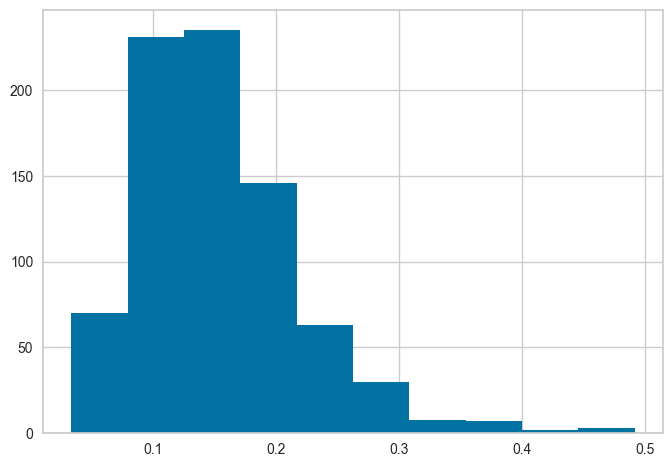

In [9]:
amount_spent_customer = global_superstore.groupby("customer_id").agg(
                                            total_discounted_price=("discounted_price","sum"),
                                            total_spent=("sales","sum"),
                                            total_original_price=("original_price","sum")
                                            ).assign(avg_discount=lambda df: df["total_discounted_price"]/df["total_original_price"])
amount_spent_customer["avg_discount"].hist()

##### Option 2 - Correlation of spending with discounts

In [ ]:

# groupby client and calculate
corr_client = global_superstore.groupby('customer_id').apply(calculate_discount_expense_correlation).reset_index()
corr_client.columns = ['customer_id', 'discount_corr']
corr_client.set_index("customer_id",inplace=True)
corr_client['discount_corr'].hist()
corr_client.head()

<Axes: xlabel='discounted_price', ylabel='sales'>

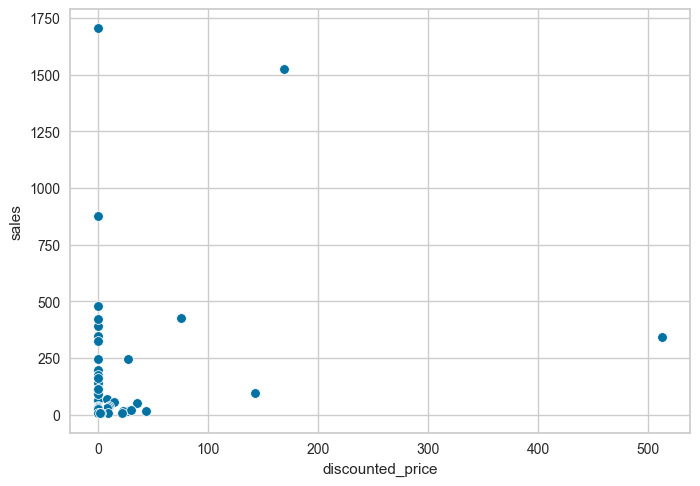

In [ ]:
sns.scatterplot(data=global_superstore[global_superstore["customer_id"]=="EB-13750"],
                x="discounted_price",
                y="sales")

#### Avg quantity per order, avg ppu per order & avg discount

In [ ]:
mean_q_ppu_discount_order = (global_superstore.groupby(["customer_id", "order_id"]
                    ).agg(
                        total_spending_order=("sales", "sum"),
                        total_quantity=("quantity", "sum"),
                        total_discounted_price=("discounted_price","sum"),
                        total_original_price=("original_price","sum"))
                    .groupby("customer_id")
                    .agg(
                        avg_original_price=("total_original_price", "mean"),
                        avg_spending_order=("total_spending_order", "mean"),
                        avg_quantity_order=("total_quantity","mean")))

mean_q_ppu_discount_order["avg_unit_price"] = mean_q_ppu_discount_order["avg_spending_order"] / mean_q_ppu_discount_order["avg_quantity_order"]
mean_q_ppu_discount_order["avg_unit_original_price"] = mean_q_ppu_discount_order["avg_original_price"] / mean_q_ppu_discount_order["avg_quantity_order"]
mean_q_ppu_discount_order.head()

,avg_original_price,avg_spending_order,avg_quantity_order,avg_unit_price,avg_unit_original_price
customer_id,,,,,
AA-10315,693.780385,615.025731,6.346154,96.913145,109.32297
AA-10375,255.929355,210.925387,5.451613,38.690456,46.945621
AA-10480,873.271600,790.363311,7.0,112.909044,124.753086
AA-10645,439.390213,368.344994,6.425532,57.325214,68.381921
AB-10015,768.758919,666.071014,8.135135,81.875839,94.498605


#### Joining metrics

Version with avg spending per order.

In [ ]:
customer_aggregated_v1 = pd.concat([avg_purchase_freq,mean_ticket_order,
                                 amount_spent_customer["avg_discount"],
                                 corr_client],axis=1)
print(f"The aggregated customer v1 df has {customer_aggregated_v1.shape[0]} rows")
customer_aggregated_v1.head()

The aggregated customer v1 df has 795 rows


,avg_orders_month,avg_spending_order,avg_shipping_cost,avg_discount,discount_corr
customer_id,,,,,
AA-10315,1.444444,615.025731,55.844231,0.128051,0.045609
AA-10375,1.192308,210.925387,32.987742,0.213364,-0.072842
AA-10480,1.315789,790.363311,72.610800,0.104899,0.130095
AA-10645,1.678571,368.344994,41.729149,0.192877,0.100239
AB-10015,1.321429,666.071014,84.548919,0.154170,0.244514


Highly correlated features impair outlier detection and clustering, therefore let's inspect correlation:

<Axes: >

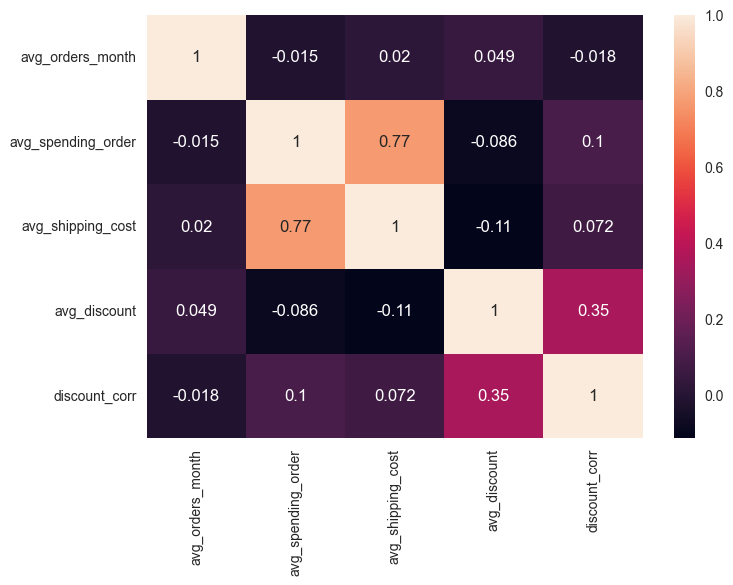

In [ ]:
sns.heatmap(customer_aggregated_v1.corr(),annot=True)

Version with avg ppu price and avg quantity.

In [ ]:
customer_aggregated_v2 = pd.concat([avg_purchase_freq,mean_ticket_order["avg_shipping_cost"],
                                    mean_q_ppu_discount_order[["avg_unit_price","avg_quantity_order"]],
                                 amount_spent_customer["avg_discount"],
                                 corr_client],axis=1)
print(f"The aggregated customer v1 df has {customer_aggregated_v2.shape[0]} rows")
customer_aggregated_v2.head()

The aggregated customer v1 df has 795 rows


,avg_orders_month,avg_shipping_cost,avg_unit_price,avg_quantity_order,avg_discount,discount_corr
customer_id,,,,,,
AA-10315,1.444444,55.844231,96.913145,6.346154,0.128051,0.045609
AA-10375,1.192308,32.987742,38.690456,5.451613,0.213364,-0.072842
AA-10480,1.315789,72.610800,112.909044,7.0,0.104899,0.130095
AA-10645,1.678571,41.729149,57.325214,6.425532,0.192877,0.100239
AB-10015,1.321429,84.548919,81.875839,8.135135,0.154170,0.244514


Highly correlated features impair outlier detection and clustering, therefore let's inspect correlation:

<Axes: >

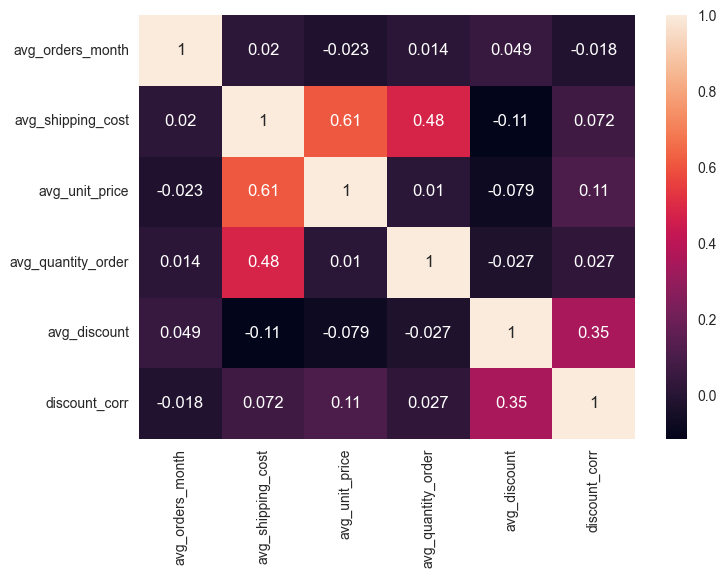

In [ ]:
sns.heatmap(customer_aggregated_v2.corr(),annot=True)

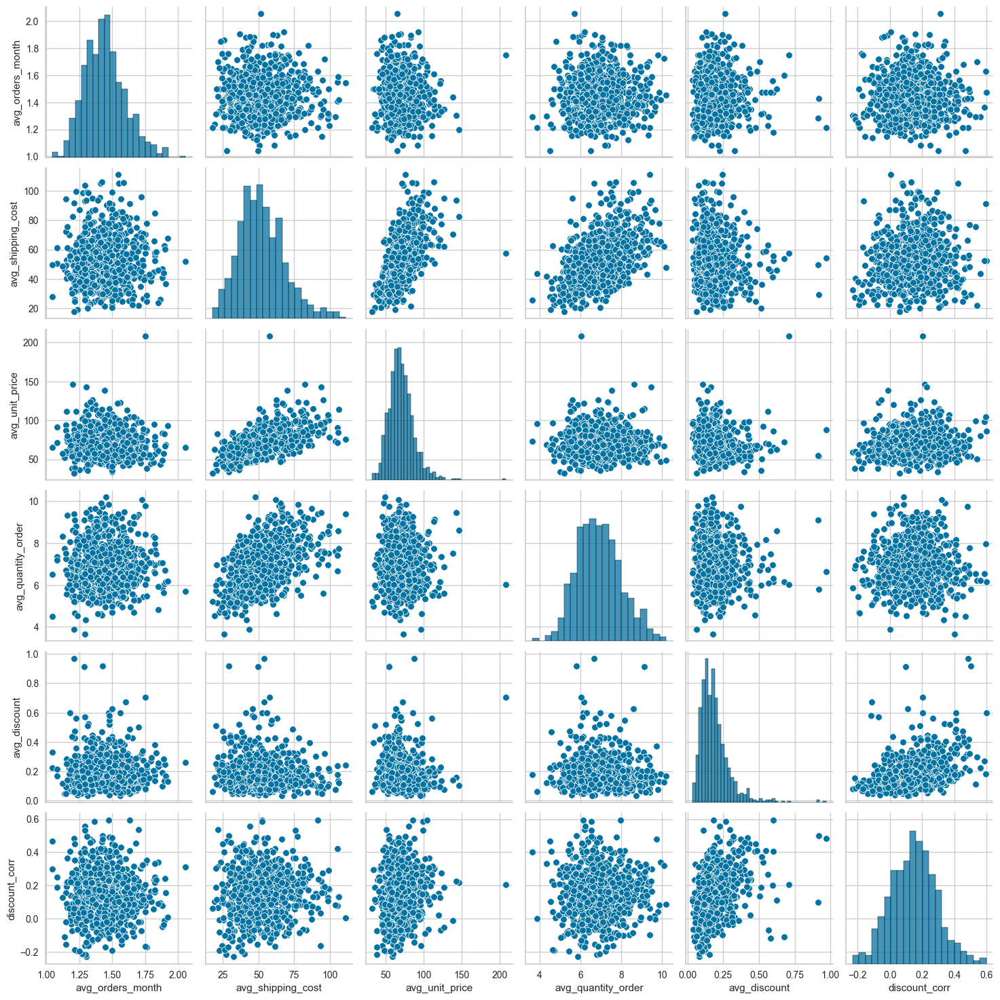

In [ ]:
sns.pairplot(customer_aggregated_v2)

In [ ]:
customer_aggregated_v3 = pd.concat([avg_purchase_freq,mean_ticket_order["avg_shipping_cost"],
                                    mean_q_ppu_discount_order[["avg_unit_original_price","avg_quantity_order"]],
                                 amount_spent_customer["avg_discount"],
                                 corr_client],axis=1)
print(f"The aggregated customer v1 df has {customer_aggregated_v3.shape[0]} rows")
customer_aggregated_v3.head()

The aggregated customer v1 df has 795 rows


,avg_orders_month,avg_shipping_cost,avg_unit_original_price,avg_quantity_order,avg_discount,discount_corr
customer_id,,,,,,
AA-10315,1.444444,55.844231,109.32297,6.346154,0.113515,0.045609
AA-10375,1.192308,32.987742,46.945621,5.451613,0.175845,-0.072842
AA-10480,1.315789,72.610800,124.753086,7.0,0.094940,0.130095
AA-10645,1.678571,41.729149,68.381921,6.425532,0.161690,0.100239
AB-10015,1.321429,84.548919,94.498605,8.135135,0.133576,0.244514


<Axes: >

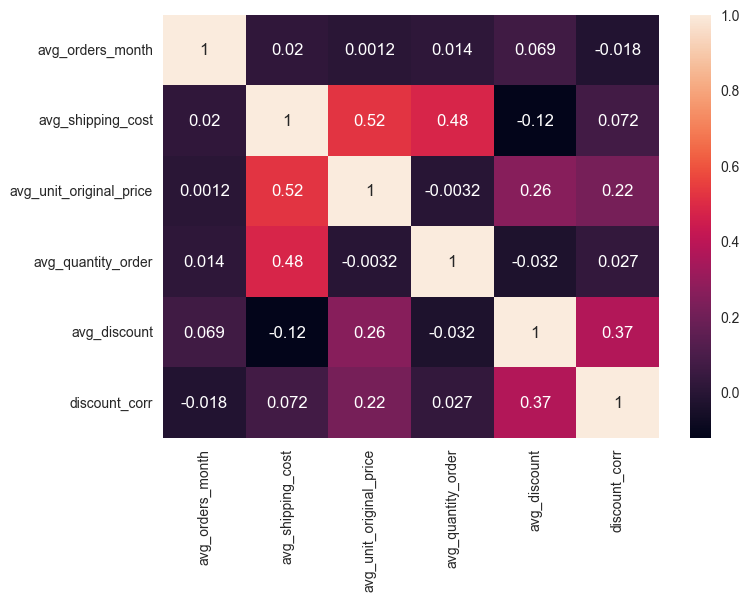

In [ ]:
sns.heatmap(customer_aggregated_v3.corr(),annot=True)

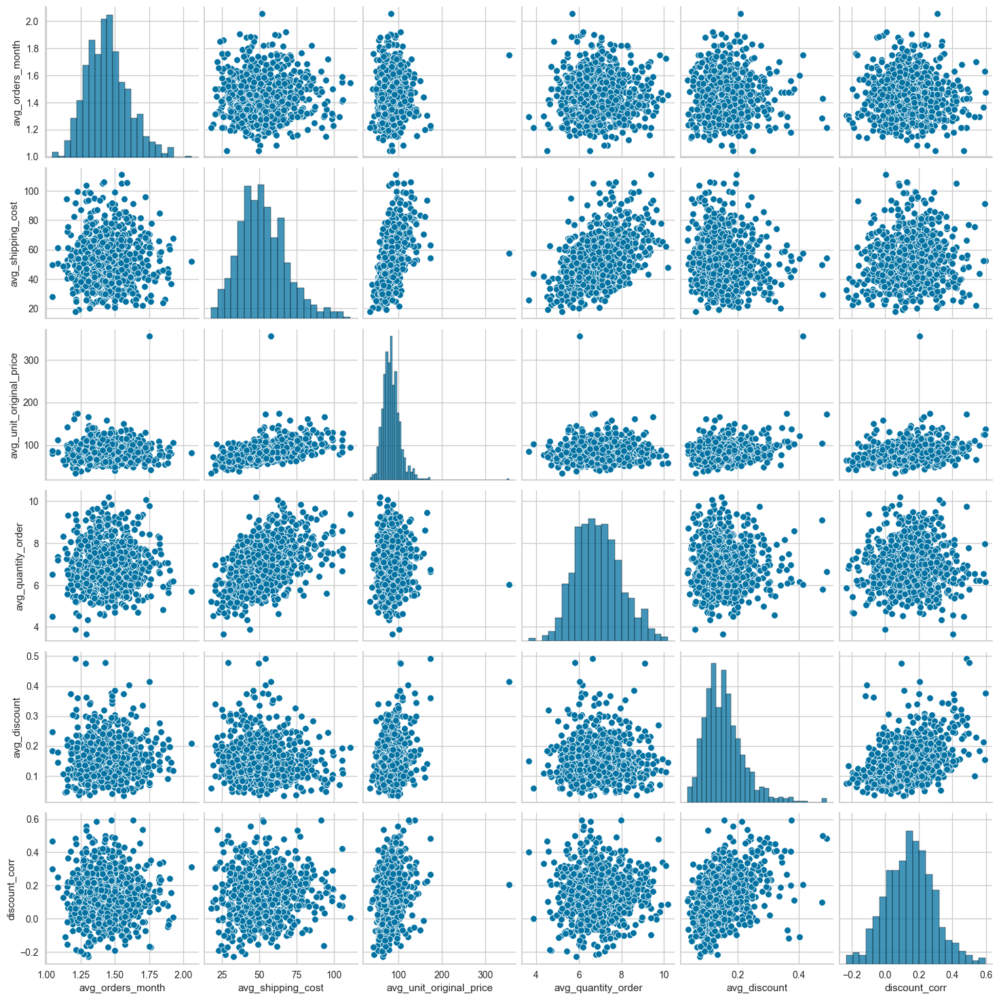

In [ ]:
sns.pairplot(customer_aggregated_v3)

## 2.3 Preprocessing

Preprocessing should include categorical encoding, outlier handling and feature scaling. As for this iteration only numerical features are included, only feature scaling and outlier handling are needed.

#### Outlier handling

Contamination set to 2%.

Handle customer_aggregated_v1 first, then v2.

In [ ]:
# detect v1
gestor_outliers = so.GestionOutliersMultivariados(customer_aggregated_v1)

customer_aggregated_v1_outliers = gestor_outliers.detectar_outliers_if(contaminacion=0.03).replace({"outlier":{1:0,-1:1}})


# detect v2
gestor_outliers = so.GestionOutliersMultivariados(customer_aggregated_v2)

customer_aggregated_v2_outliers = gestor_outliers.detectar_outliers_if(contaminacion=0.03).replace({"outlier":{1:0,-1:1}})

# detect v2
gestor_outliers = so.GestionOutliersMultivariados(customer_aggregated_v3)

customer_aggregated_v3_outliers = gestor_outliers.detectar_outliers_if(contaminacion=0.03).replace({"outlier":{1:0,-1:1}})

Inspecting the results via pairplots:

Pairplot of version 1


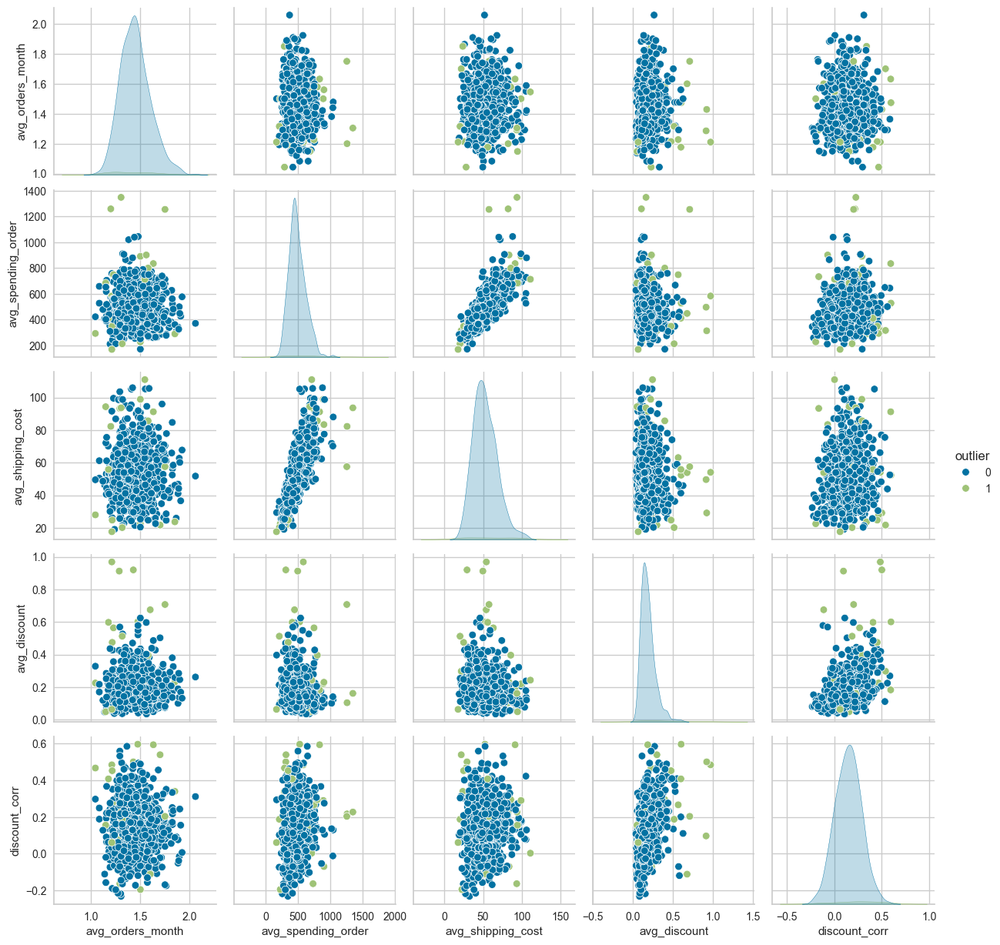



Pairplot of version 2


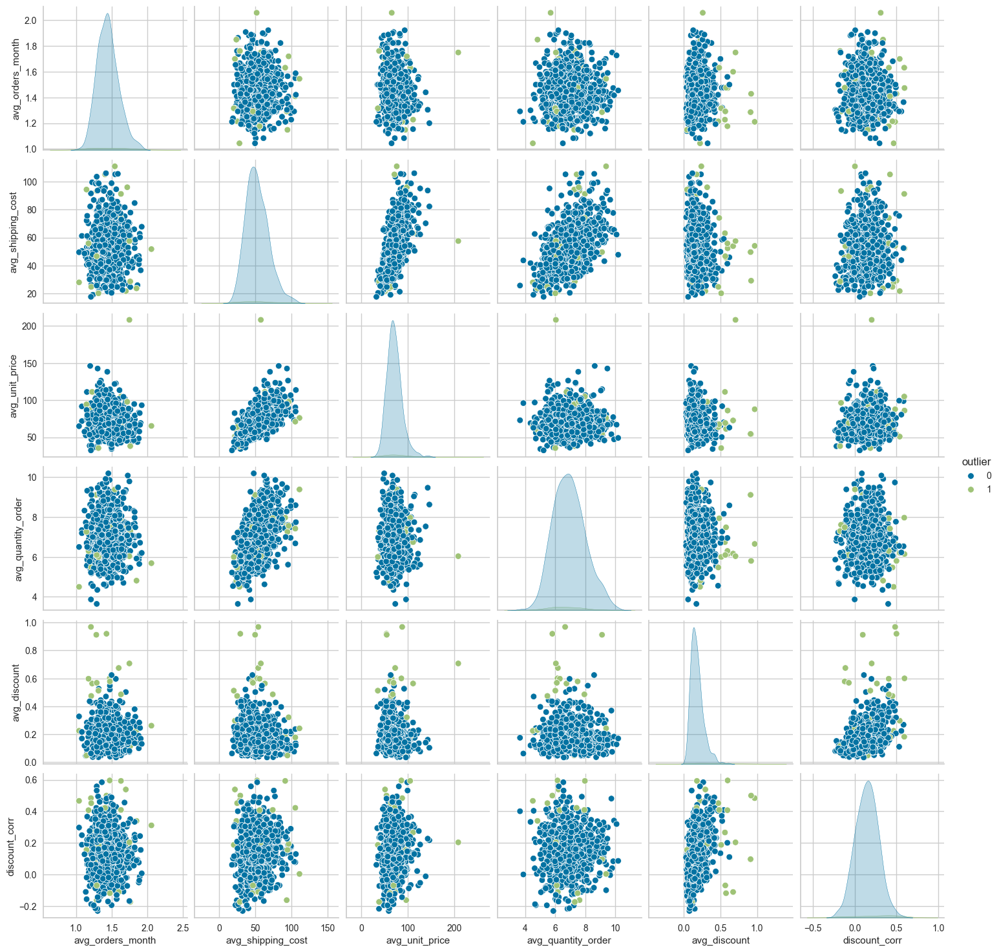



Pairplot of version 3


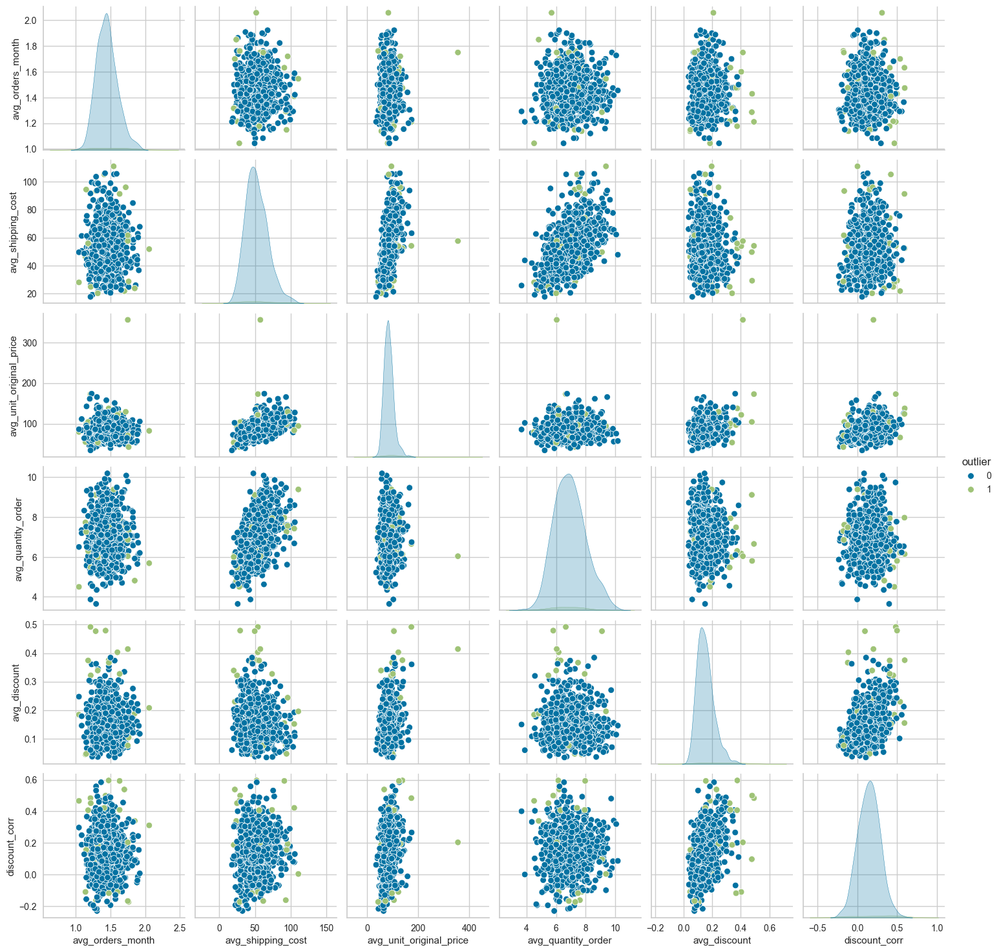

In [ ]:
print("Pairplot of version 1") # cannot use titles apparently
sns.pairplot(customer_aggregated_v1_outliers, hue="outlier")
plt.show()

print("\n\nPairplot of version 2")
sns.pairplot(customer_aggregated_v2_outliers, hue="outlier")
plt.show()

print("\n\nPairplot of version 3")
sns.pairplot(customer_aggregated_v3_outliers, hue="outlier")
plt.show()

Outliers detected visually look correct. To not introduce noise into the model, these records are better left out of the clustering process. Therefore:

In [ ]:
customer_aggregated_v1_outliers = customer_aggregated_v1_outliers[customer_aggregated_v1_outliers["outlier"]==0].drop(columns="outlier")

customer_aggregated_v2_outliers = customer_aggregated_v2_outliers[customer_aggregated_v2_outliers["outlier"]==0].drop(columns="outlier")

customer_aggregated_v3_outliers = customer_aggregated_v3_outliers[customer_aggregated_v3_outliers["outlier"]==0].drop(columns="outlier")

##### Feature scaling

To retain the maximum information possible about distances, we use robust scaling.

In [ ]:
scaler = RobustScaler()

customer_aggregated_v1_scaled = pd.DataFrame(scaler.fit_transform(customer_aggregated_v1_outliers),
                                             columns=customer_aggregated_v1_outliers.columns)
customer_aggregated_v1_scaled

customer_aggregated_v2_scaled = pd.DataFrame(scaler.fit_transform(customer_aggregated_v2_outliers),
                                             columns=customer_aggregated_v2_outliers.columns)
customer_aggregated_v2_scaled

customer_aggregated_v3_scaled = pd.DataFrame(scaler.fit_transform(customer_aggregated_v3_outliers),
                                             columns=customer_aggregated_v3_outliers.columns)
customer_aggregated_v3_scaled

,avg_orders_month,avg_shipping_cost,avg_unit_original_price,avg_quantity_order,avg_discount,discount_corr
0,0.047419,0.241393,1.148012,-0.352893,-0.421758,-0.541100
1,-1.190034,-0.822190,-1.458638,-0.945564,0.416794,-1.174135
2,-0.584002,1.021594,1.792812,0.080308,-0.671660,-0.089587
3,1.196483,-0.415425,-0.562849,-0.300301,0.226363,-0.249145
4,-0.556326,1.577111,0.528525,0.832384,-0.151870,0.521899
...,...,...,...,...,...,...
766,-0.349176,-0.690055,-0.658086,0.146562,-0.151653,0.842342
767,-0.702394,1.157373,1.192993,-0.218905,-0.600231,2.059083
768,-0.497899,0.151431,1.031767,-0.106032,-0.261007,-0.697616
769,0.729067,1.412973,1.376065,1.265911,1.510046,0.347079


#### Visualize results

To get an intuition for the separability of the data, let's plot the pairplots for the scaled data.

Version 1 of customer aggregated data:

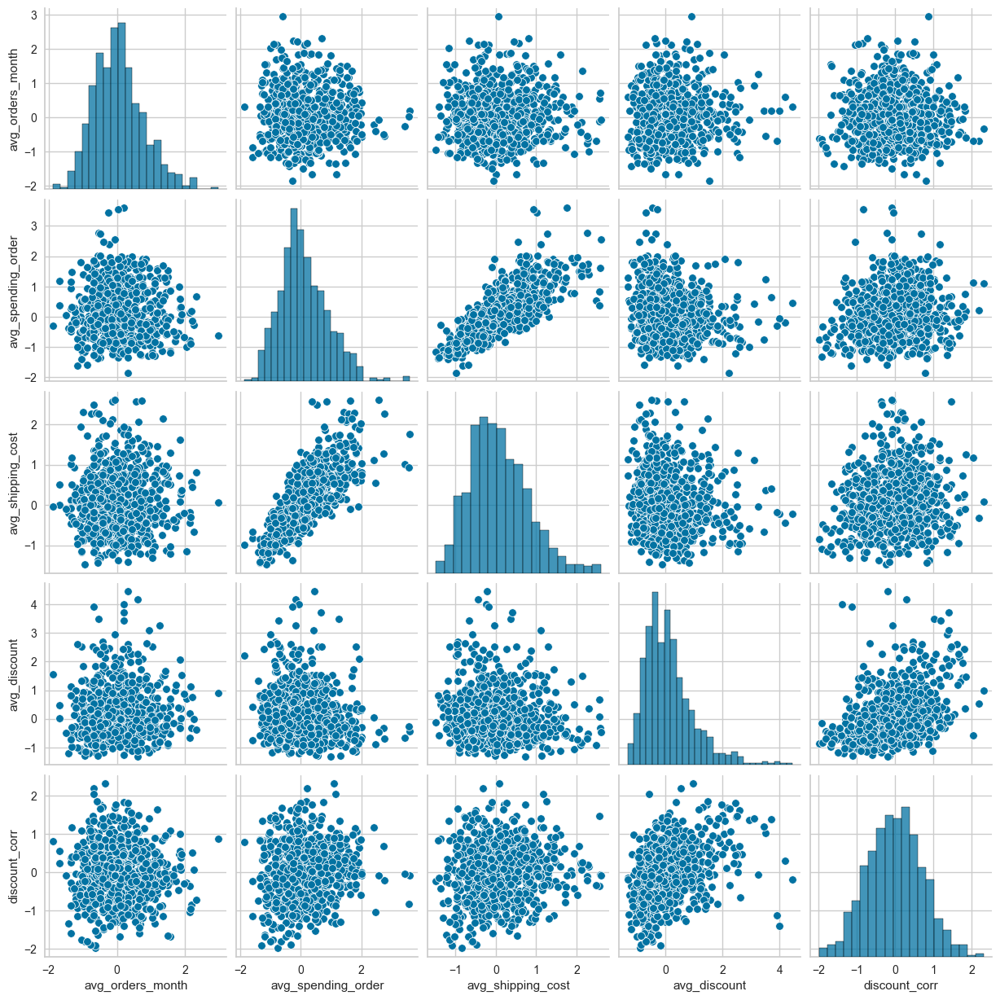

In [ ]:
sns.pairplot(customer_aggregated_v1_scaled)

Version 2 of customer aggregated data:

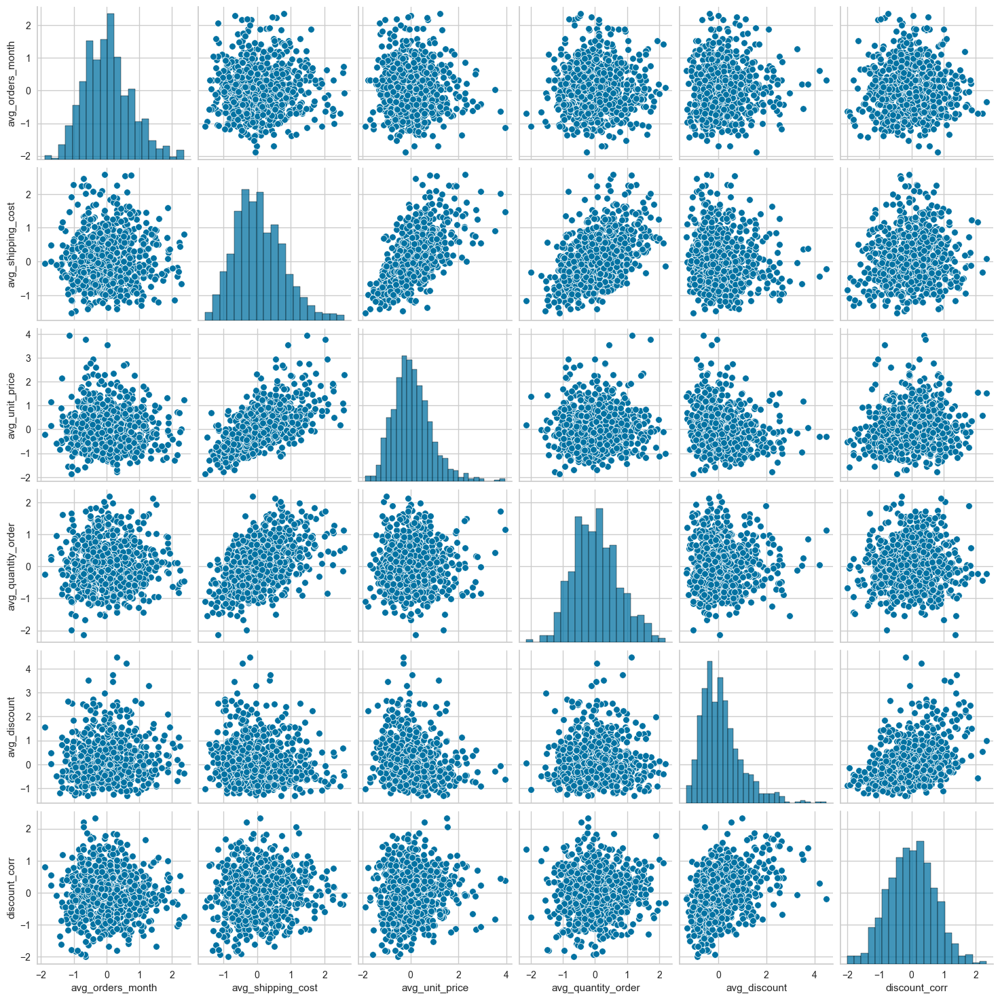

In [ ]:
sns.pairplot(customer_aggregated_v2_scaled)

### Dimensionality reduction

The above pairplots do not show a single pairwise relationship that looks separable. There is a method for dimensionality reduction called t-SNE that helps visualize if data is separable even in a high dimensional space.

#### t-SNE

Applying t-SNE for version 1:

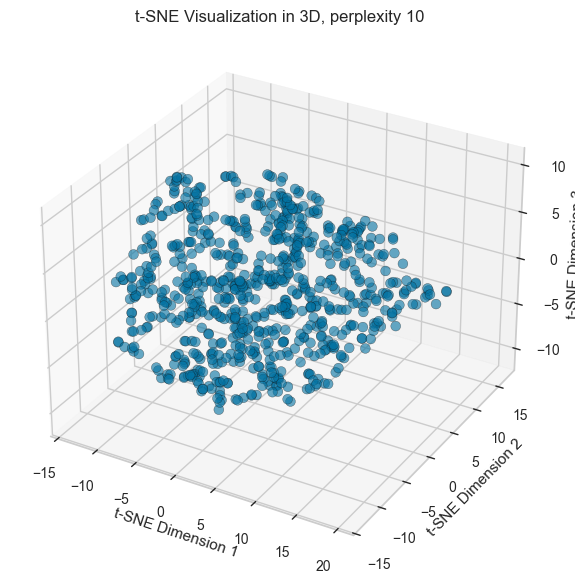

In [ ]:
t_sne(customer_aggregated_v1_scaled,dim=3,perplexity=10)

Applying t-SNE for version 2:

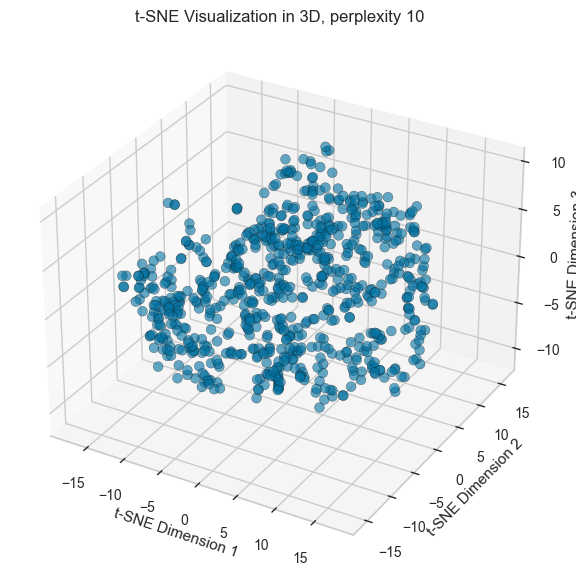

In [ ]:
t_sne(customer_aggregated_v2_scaled,dim=3,perplexity=10)

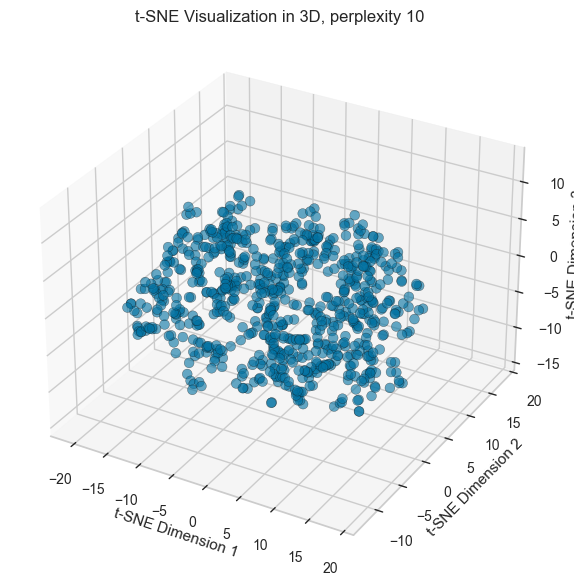

In [ ]:
t_sne(customer_aggregated_v3_scaled,dim=3,perplexity=10)

t-SNE does not show clearly separable clusters either, although the results depend highly on the perplexity parameter. 

There is another dimensionality reduction technique worth trying, PCA.

#### Principal Component Analysis (PCA)

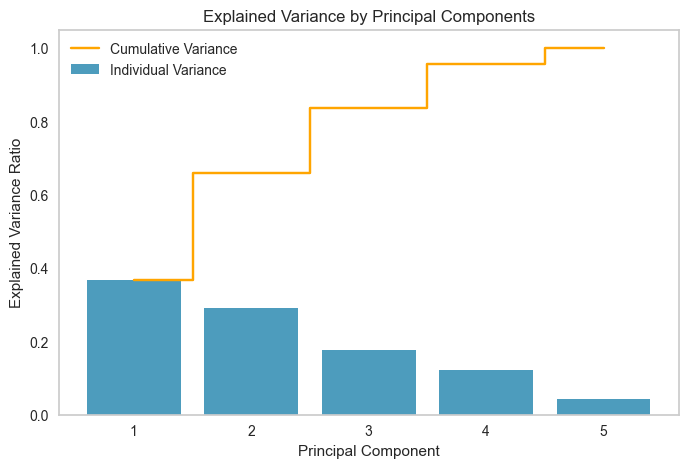

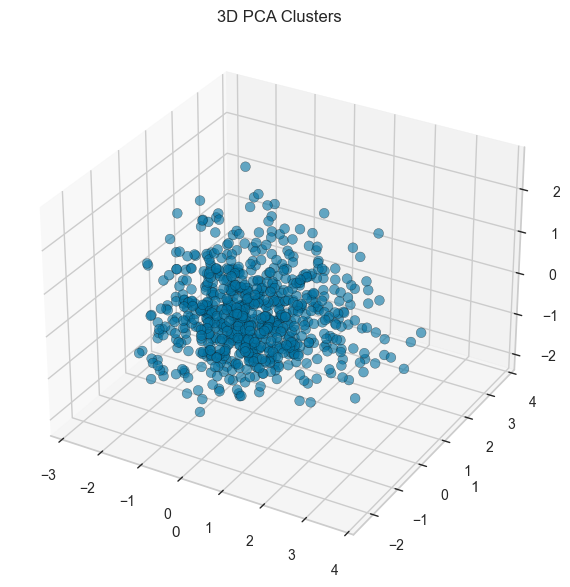

In [ ]:
X_pca_v1 = perform_PCA(customer_aggregated_v1_scaled)
plot_3D_clusters(X_pca_v1)

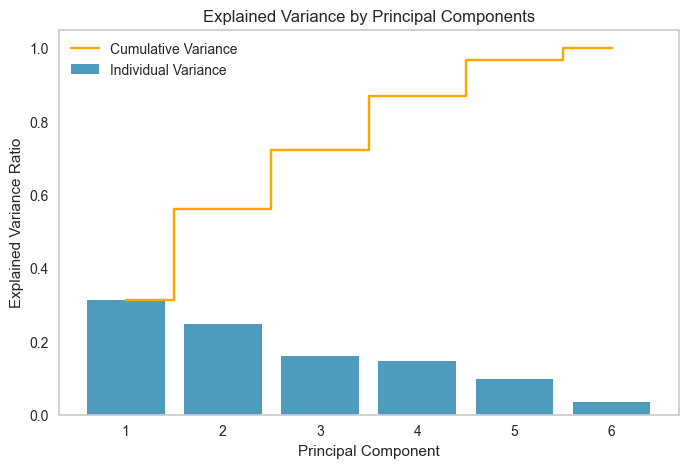

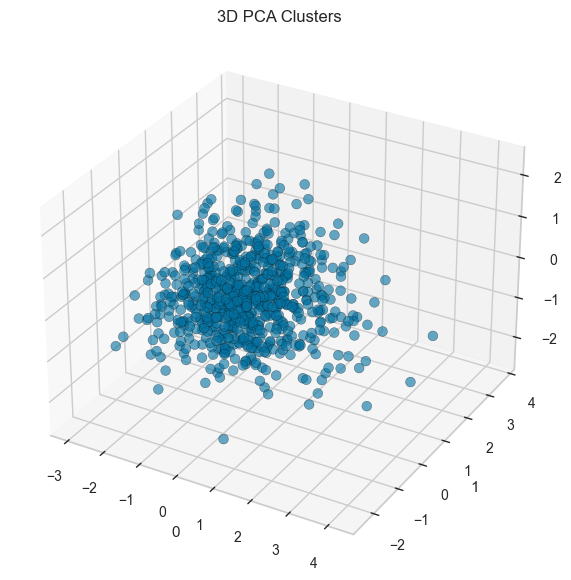

In [ ]:
X_pca_v2 = perform_PCA(customer_aggregated_v2_scaled)
plot_3D_clusters(X_pca_v2)

PCA does not look like it does a great job separating features either. Besides, its best use is to reduce dimensions while retaining the most variance. In this case, the suggested subsets only have 5 and 6 features, and PCA does not achieve a good enough compression. Therefore, it will be left for later when encoded categorical features are introduced into the model.

# 2.4 Clustering

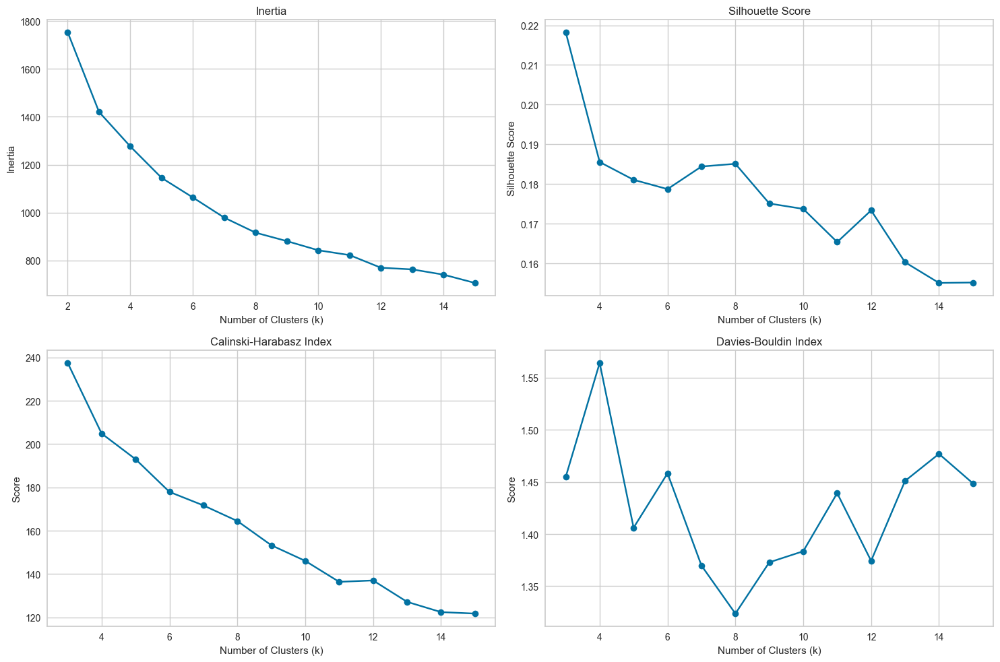

In [ ]:
choose_kmeans_k(customer_aggregated_v1_scaled)

c:\Users\Miguel\Desktop\Hackio\Proyectos\9. Clustering - Regresión\notebook\..\src\soporte_clustering.py:480: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


c:\Users\Miguel\Desktop\Hackio\Proyectos\9. Clustering - Regresión\notebook\..\src\soporte_clustering.py:480: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


c:\Users\Miguel\Desktop\Hackio\Proyectos\9. Clustering - Regresión\notebook\..\src\soporte_clustering.py:480: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


c:\Users\Miguel\Desktop\Hackio\Proyectos\9. Clustering - Regresión\notebook\..\src\soporte_clustering.py:480: Futur

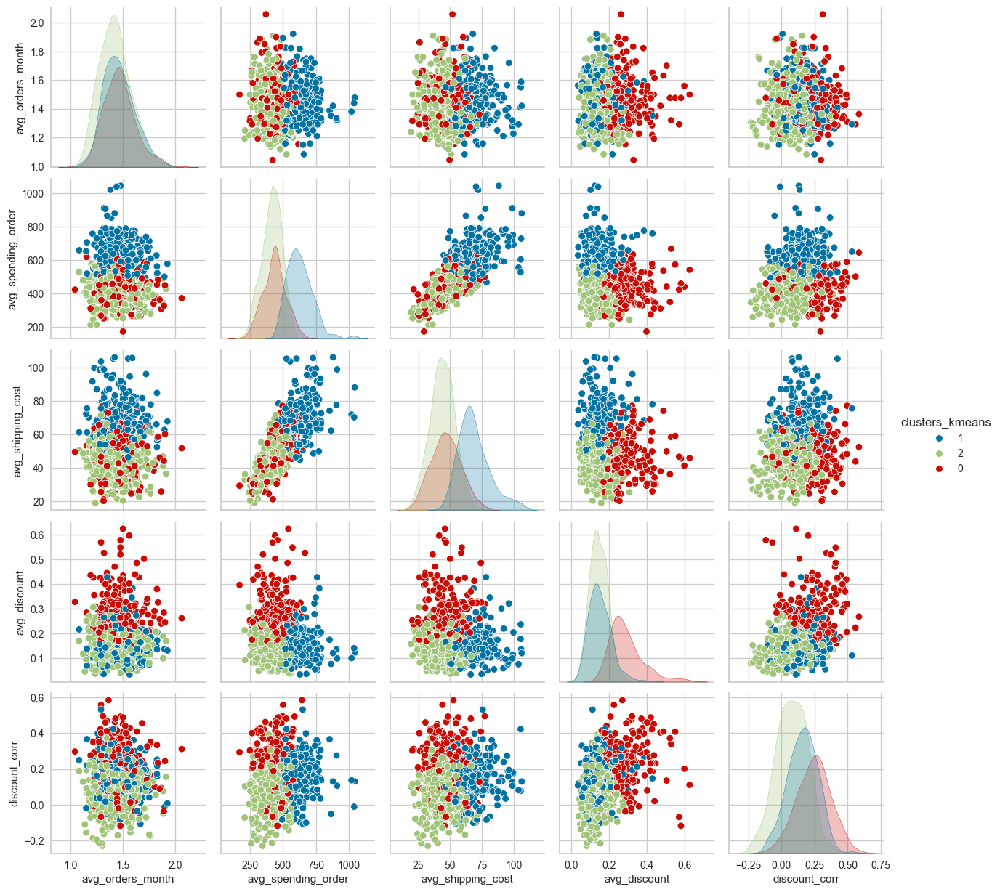

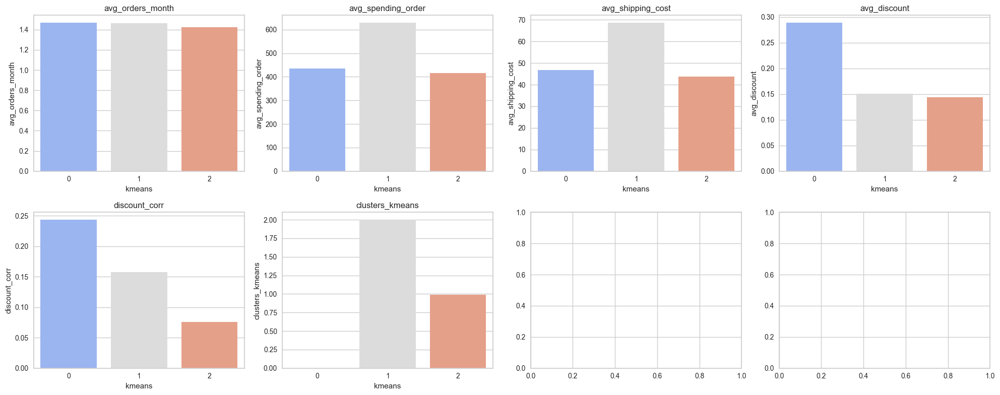

In [ ]:
warnings.filterwarnings("ignore")
customer_aggregated_v1_outliers = customer_aggregated_v1_outliers.astype("float")
clusterizador_v1 = sc.Clustering(customer_aggregated_v1_outliers)

# 
clusterizador_v1.preparar_dataframe(scaler="robust")

customer_aggregated_v2_clustered = clusterizador_v1.modelo_kmeans(customer_aggregated_v1_outliers,3)

sns.pairplot(customer_aggregated_v2_clustered, hue="clusters_kmeans")

clusterizador_v1.plot_clusters("kmeans")
warnings.filterwarnings("default")

c:\Users\Miguel\Desktop\Hackio\Proyectos\9. Clustering - Regresión\notebook\..\src\soporte_clustering.py:480: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


c:\Users\Miguel\Desktop\Hackio\Proyectos\9. Clustering - Regresión\notebook\..\src\soporte_clustering.py:480: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


c:\Users\Miguel\Desktop\Hackio\Proyectos\9. Clustering - Regresión\notebook\..\src\soporte_clustering.py:480: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


c:\Users\Miguel\Desktop\Hackio\Proyectos\9. Clustering - Regresión\notebook\..\src\soporte_clustering.py:480: Futur

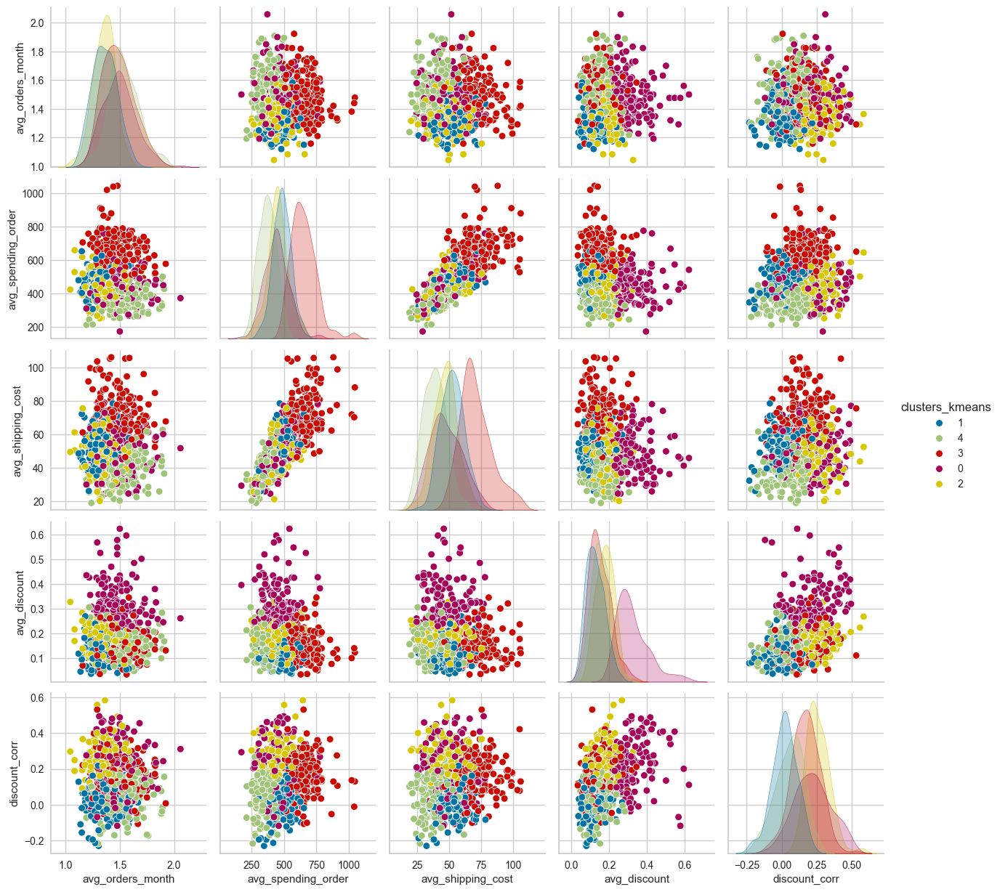

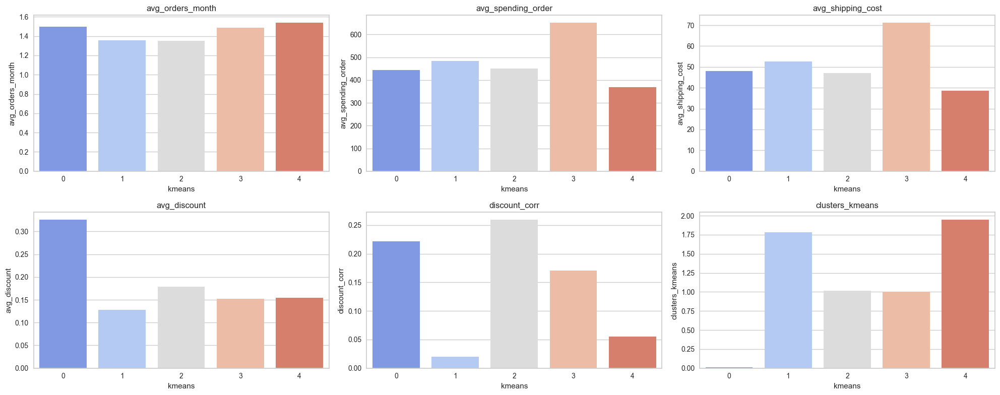

In [ ]:
warnings.filterwarnings("ignore")
customer_aggregated_v1_outliers = customer_aggregated_v1_outliers.astype("float")
clusterizador_v1 = sc.Clustering(customer_aggregated_v1_outliers)

# 
clusterizador_v1.preparar_dataframe(scaler="robust")

customer_aggregated_v2_clustered = clusterizador_v1.modelo_kmeans(customer_aggregated_v1_outliers,4)

sns.pairplot(customer_aggregated_v2_clustered, hue="clusters_kmeans")

clusterizador_v1.plot_clusters("kmeans")

warnings.filterwarnings("default")

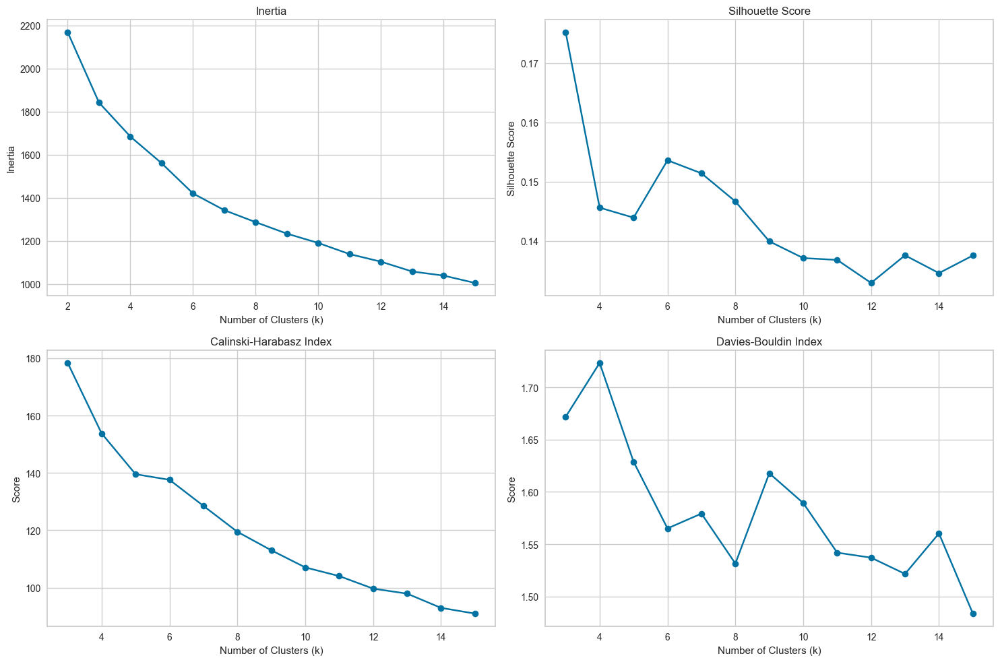

In [101]:
choose_kmeans_k(customer_aggregated_v2_scaled)

c:\Users\Miguel\Desktop\Hackio\Proyectos\9. Clustering - Regresión\notebook\..\src\soporte_clustering.py:480: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


c:\Users\Miguel\Desktop\Hackio\Proyectos\9. Clustering - Regresión\notebook\..\src\soporte_clustering.py:480: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


c:\Users\Miguel\Desktop\Hackio\Proyectos\9. Clustering - Regresión\notebook\..\src\soporte_clustering.py:480: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


c:\Users\Miguel\Desktop\Hackio\Proyectos\9. Clustering - Regresión\notebook\..\src\soporte_clustering.py:480: Futur

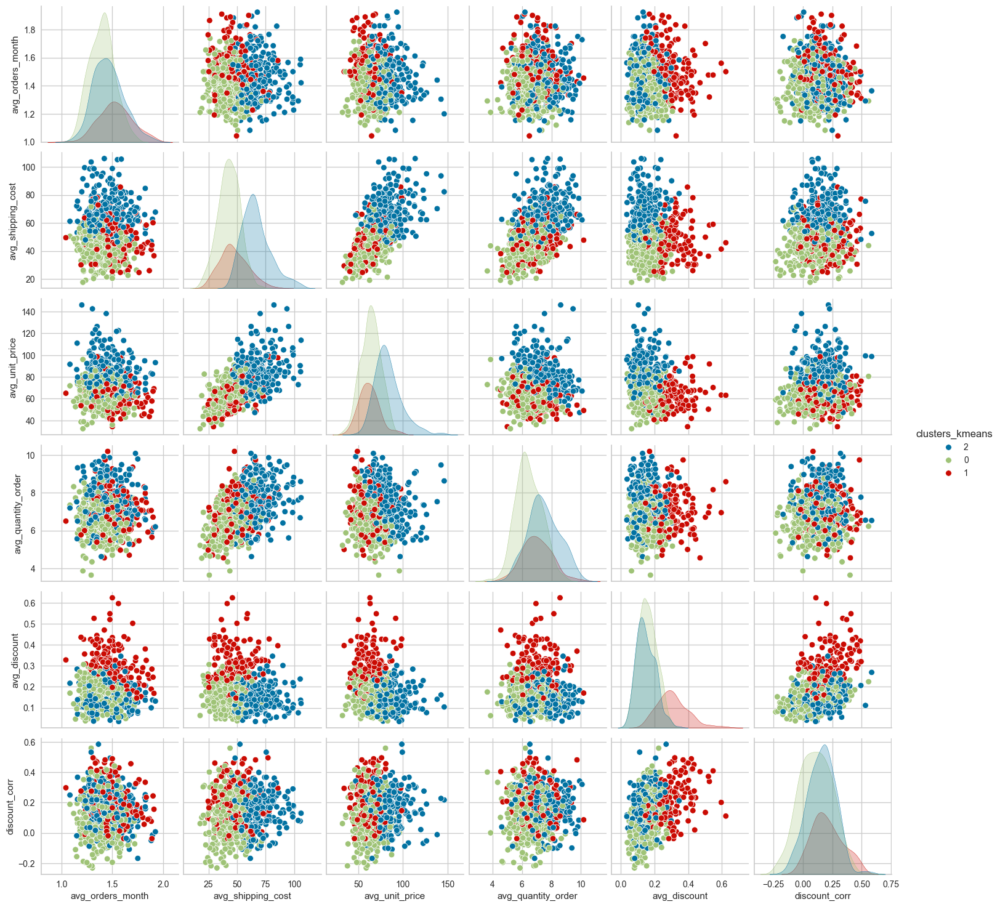

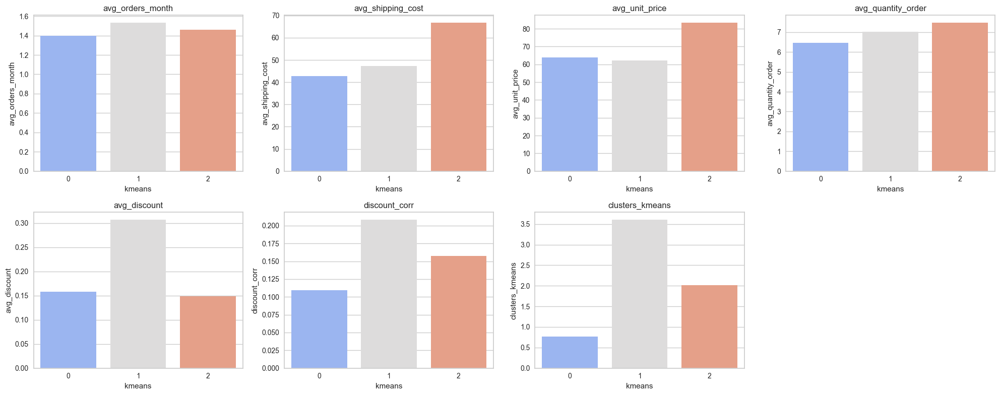

In [ ]:
warnings.filterwarnings("ignore")
customer_aggregated_v2_outliers = customer_aggregated_v2_outliers.astype("float")
clusterizador_v2 = sc.Clustering(customer_aggregated_v2_outliers)

# 
clusterizador_v2.preparar_dataframe(scaler="robust")

customer_aggregated_v2_clustered = clusterizador_v2.modelo_kmeans(customer_aggregated_v2_outliers,3)

sns.pairplot(customer_aggregated_v2_clustered, hue="clusters_kmeans")

clusterizador_v2.plot_clusters("kmeans")
warnings.filterwarnings("default")

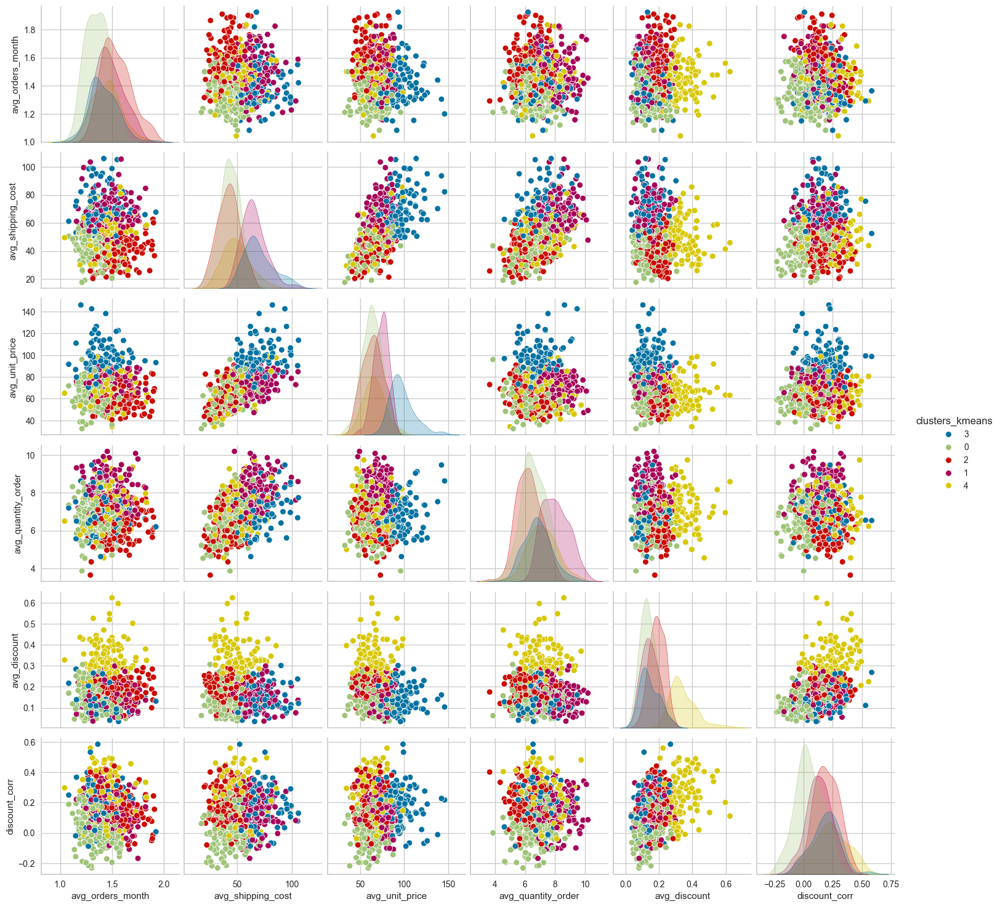

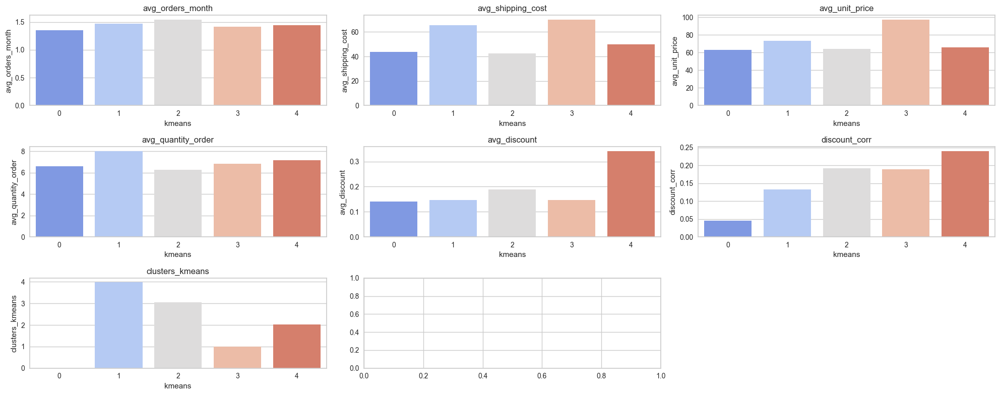

In [138]:
warnings.filterwarnings("ignore")
customer_aggregated_v2_outliers = customer_aggregated_v2_outliers.astype("float")
clusterizador_v2 = sc.Clustering(customer_aggregated_v2_outliers)

# 
clusterizador_v2.preparar_dataframe(scaler="robust")

customer_aggregated_v2_clustered = clusterizador_v2.modelo_kmeans(customer_aggregated_v2_outliers,5)

sns.pairplot(customer_aggregated_v2_clustered, hue="clusters_kmeans")

clusterizador_v2.plot_clusters("kmeans")

warnings.filterwarnings("default")